In [1]:
import torch
import numpy as np
import os
import matplotlib.pyplot as plt

from PIL import Image
from pathlib import Path

from sam2.build_sam import build_sam2
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.build_sam import build_sam2_video_predictor

from utils import show_anns, show_mask, show_points

from torchmetrics import JaccardIndex

In [13]:
# DATA_PATH = Path("/home/mereur1/projects/ocl/segment-anything-2/notebooks/venice_short/").resolve()
DATA_PATH = Path("/home/mereur1/projects/ocl/segment-anything-2/notebooks/data/venice_short/").resolve()
print(DATA_PATH)
assert DATA_PATH.exists()  

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f"Using device: {device}")

if device.type == "cuda":
    # use bfloat16 for the entire notebook
    torch.autocast("cuda", dtype=torch.bfloat16).__enter__()
    # turn on tfloat32 for Ampere GPUs (https://pytorch.org/docs/stable/notes/cuda.html#tensorfloat-32-tf32-on-ampere-devices)
    if torch.cuda.get_device_properties(0).major >= 8:
        torch.backends.cuda.matmul.allow_tf32 = True
        torch.backends.cudnn.allow_tf32 = True


np.random.seed(3)

/home/mereur1/projects/ocl/segment-anything-2/notebooks/data/venice_short
Using device: cuda


# Step 1: Generate the mask for frame0 
### (using the SAM2AutomaticMaskGenerator)

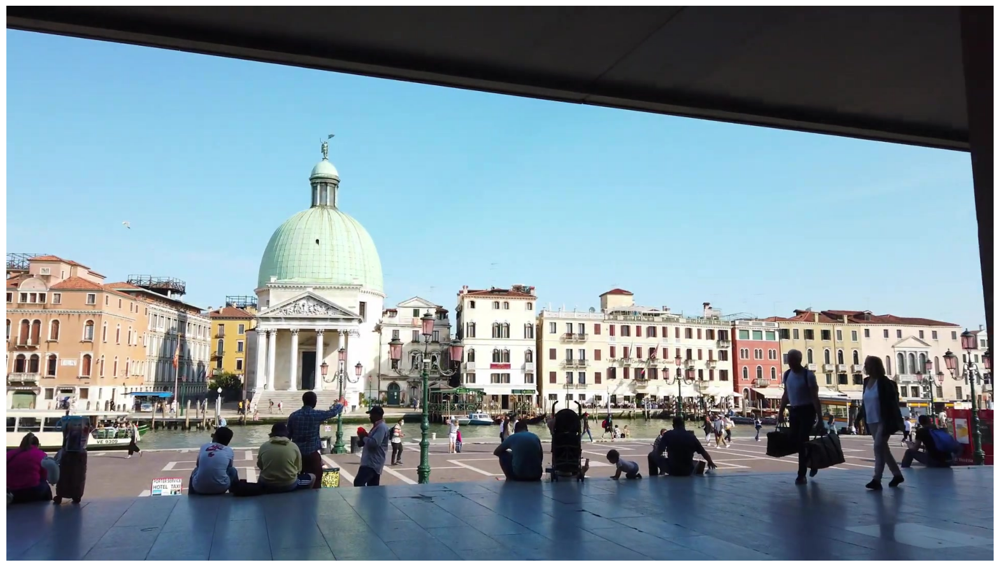

In [14]:
start_idx = 1000
first_frame_path = DATA_PATH / f"{start_idx:08d}.jpg"
first_frame = Image.open(first_frame_path)
first_frame = np.array(first_frame.convert("RGB"))

visualize = False

plt.figure(figsize=(20, 20))
plt.imshow(first_frame)
plt.axis('off')
plt.show()

Load SAM and instantiate the AutomaticMaskGenerator:

In [15]:
sam2_checkpoint = Path("/home/mereur1/projects/ocl/clip_seg/segment-anything-2/checkpoints/sam2_hiera_tiny.pt")
model_cfg = "sam2_hiera_t.yaml"
sam2 = build_sam2(model_cfg, sam2_checkpoint, device=device, apply_postprocessing=False)

mask_generator = SAM2AutomaticMaskGenerator(
    model=sam2,
    # points_per_side=32,
    points_per_side=16,
    points_per_batch=128,
    pred_iou_thresh=0.7,
    stability_score_thresh=0.9,
    stability_score_offset=0.7,
    crop_n_layers=1,
    box_nms_thresh=0.7,
    crop_n_points_downscale_factor=2,
    min_mask_region_area=20.0,
    use_m2m=True,

    # ## From the original notebook    
    # model=sam2,
    # points_per_side=64,
    # # points_per_side=32,
    # points_per_batch=128,
    # pred_iou_thresh=0.9,
    # stability_score_thresh=0.95,
    # stability_score_offset=0.7,
    # crop_n_layers=1,
    # box_nms_thresh=0.7,
    # crop_n_points_downscale_factor=2,
    # min_mask_region_area=400.0,
    # use_m2m=True,
)
masks = mask_generator.generate(first_frame)


In [16]:
masks = sorted(masks, key=(lambda x: x["area"]), reverse=True)


Visualization of the masks with the points used by the algorithm to select the segmentation masks

67


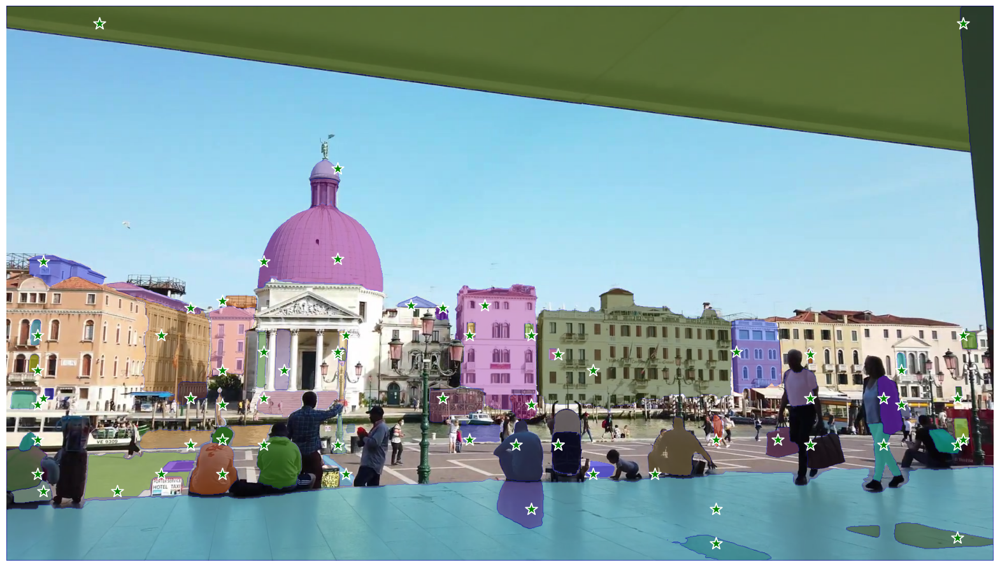

In [17]:
# print(masks[0].keys())
# points = []
# for mask in masks:
#     points.append(mask["point_coords"])
# points = np.concatenate(points)
# labels=np.ones(points.shape[0])
# print(points.shape)
print(len(masks))
plt.figure(figsize=(20, 20))
plt.imshow(first_frame)
show_anns(masks)
# show_points(coords=points, labels=labels, ax=plt.gca())
plt.axis('off')
# plt.savefig(f'/home/mereur1/projects/ocl/segment-anything-2/notebooks/results/seg_sam2_ref.png')
plt.show()

# Step 2: Propagate the masks from frame0 forward

In [18]:
predictor = build_sam2_video_predictor(model_cfg, sam2_checkpoint, device=device)

# scan all the JPEG frame names in this directory
frame_names = [
    p for p in os.listdir(DATA_PATH)
    if os.path.splitext(p)[-1] in [".jpg", ".jpeg", ".JPG", ".JPEG"]
]
frame_names.sort(key=lambda p: int(os.path.splitext(p)[0]))
print(frame_names)
inference_state = predictor.init_state(video_path=str(DATA_PATH))


['00001000.jpg', '00001100.jpg', '00001200.jpg', '00001300.jpg', '00001400.jpg']


frame loading (JPEG): 100%|██████████| 5/5 [00:00<00:00, 36.50it/s]


In [19]:
prompts = {}
ann_frame_idx = 0
from tqdm import tqdm

for idx, mask in enumerate(tqdm(masks)):
    ann_obj_id = idx
    # print(type(mask['segmentation']))
    segmentation = torch.from_numpy(mask["segmentation"])
    prompts[(ann_obj_id, ann_frame_idx)] = segmentation
    
    f_idx, out_obj_ids, out_mask_logits = predictor.add_new_mask(
        inference_state=inference_state,
        frame_idx=ann_frame_idx,
        obj_id=ann_obj_id,
        mask=segmentation,
    )

100%|██████████| 67/67 [00:00<00:00, 132.52it/s]


In [20]:
max_frame_num_to_track = 3
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in \
    predictor.propagate_in_video(inference_state, max_frame_num_to_track=max_frame_num_to_track):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 4/4 [00:01<00:00,  3.19it/s]


Visualization of the masks over 3 frames 

In [21]:
if visualize:
    # render the segmentation results every few frames
    vis_frame_stride = 1
    plt.close("all")
    # for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
    for out_frame_idx in range(0, max_frame_num_to_track + 1, vis_frame_stride):
        plt.figure(figsize=(6, 4))
        plt.title(f"frame {out_frame_idx}")
        plt.imshow(Image.open(os.path.join(DATA_PATH, frame_names[out_frame_idx])))
        print(video_segments[out_frame_idx].keys())
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            # print(out_obj_id)
            # print(out_mask)
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
            # if out_obj_id > 19: break 
        plt.savefig(f'./results/seg_sam2_{out_frame_idx}.png')
        plt.axis("off")
        plt.show()

# Step 3: Generate the segmentation masks in the dest. frame

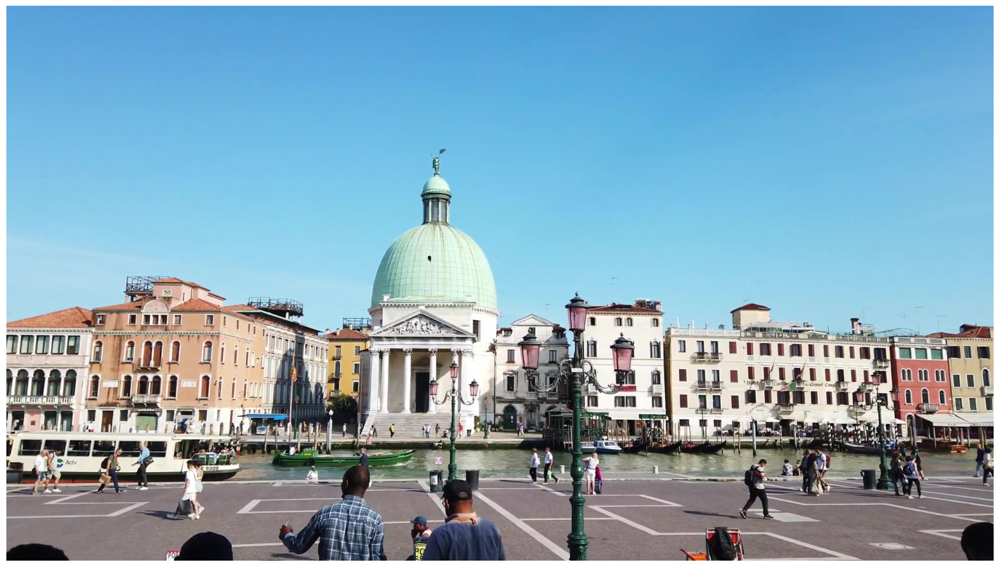

In [22]:
second_idx = 1300
second_frame_path = DATA_PATH / f"{second_idx:08d}.jpg"
second_frame = Image.open(second_frame_path)
second_frame = np.array(second_frame.convert("RGB"))

plt.figure(figsize=(20, 20))
plt.imshow(second_frame)
plt.axis('off')
plt.show()


79


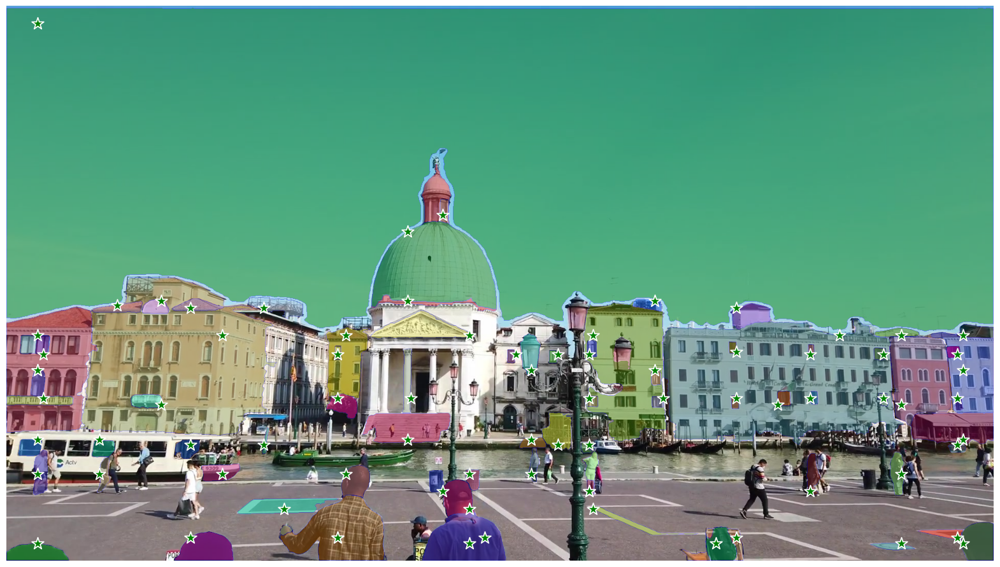

In [23]:
masks_frame2 = mask_generator.generate(second_frame)
masks_frame2 = sorted(masks_frame2, key=(lambda x: x["area"]), reverse=True)

print(len(masks_frame2))
plt.figure(figsize=(20, 20))
plt.imshow(second_frame)
show_anns(masks_frame2)
plt.axis('off')
plt.show()

# Step 4: Align the two masks (using IoU)

This code plots the two masks as blue and red -> if they overlap we get a purple area while the non overlapping part is blue or red

Mask Aread: 93967
Object 2 is the same as mask 1 with Jaccard index 0.9579542875289917
Opposite Jaccard index 0.9579542875289917


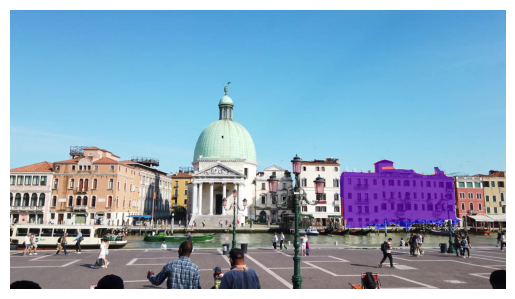

Mask Aread: 35726
Object 3 is the same as mask 4 with Jaccard index 0.9674412608146667
Opposite Jaccard index 0.9674412608146667


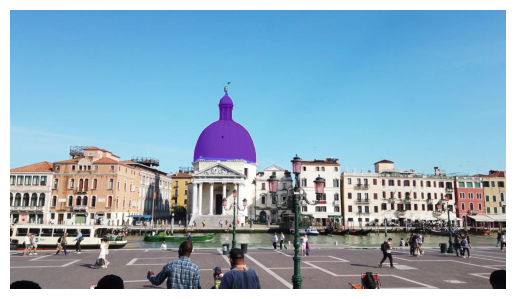

Mask Aread: 35726
Object 5 is the same as mask 4 with Jaccard index 0.9089359045028687
Opposite Jaccard index 0.9089359045028687


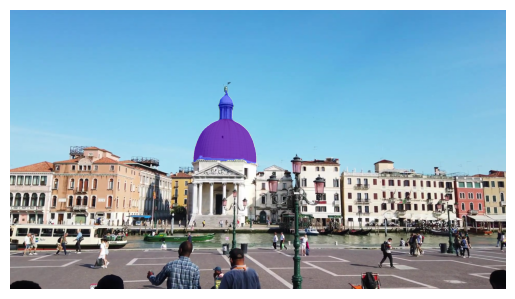

Mask Aread: 34008
Object 4 is the same as mask 5 with Jaccard index 0.953736424446106
Opposite Jaccard index 0.953736424446106


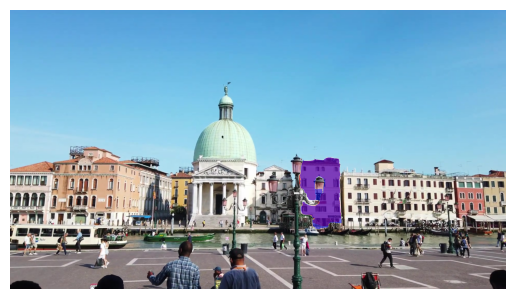

Mask Aread: 29724
Object 3 is the same as mask 6 with Jaccard index 0.9279607534408569
Opposite Jaccard index 0.9279607534408569


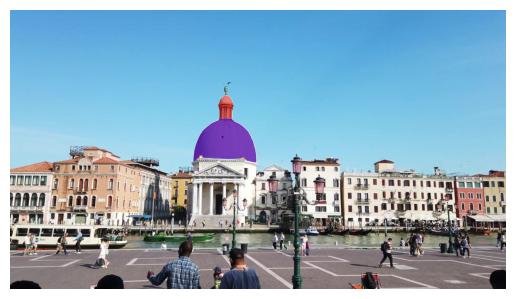

Mask Aread: 29724
Object 5 is the same as mask 6 with Jaccard index 0.9901559948921204
Opposite Jaccard index 0.9901559948921204


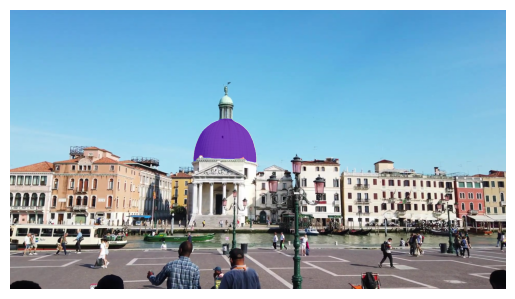

Mask Aread: 16730
Object 9 is the same as mask 9 with Jaccard index 0.9718441367149353
Opposite Jaccard index 0.9718441367149353


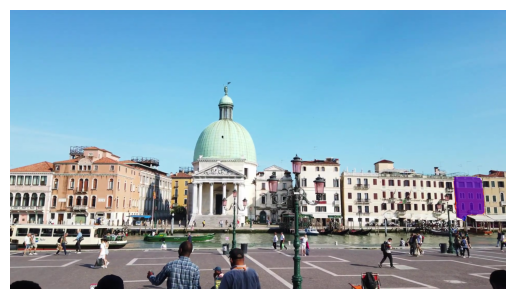

Mask Aread: 9102
Object 10 is the same as mask 13 with Jaccard index 0.9766295552253723
Opposite Jaccard index 0.9766295552253723


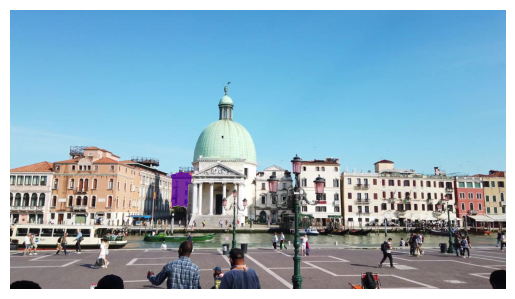

Mask Aread: 8524
Object 24 is the same as mask 15 with Jaccard index 0.9415998458862305
Opposite Jaccard index 0.9415998458862305


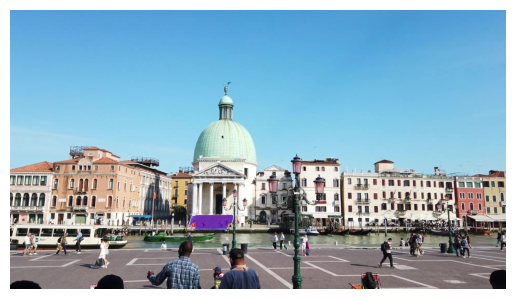

Mask Aread: 4447
Object 46 is the same as mask 19 with Jaccard index 0.8882304430007935
Opposite Jaccard index 0.8882304430007935


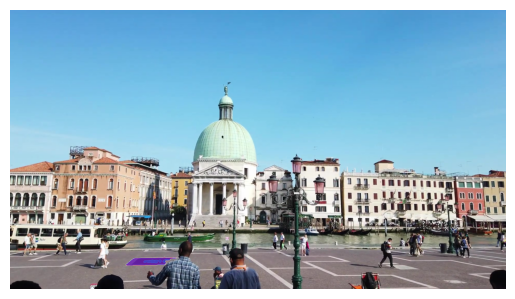

Mask Aread: 3347
Object 11 is the same as mask 23 with Jaccard index 0.993117094039917
Opposite Jaccard index 0.993117094039917


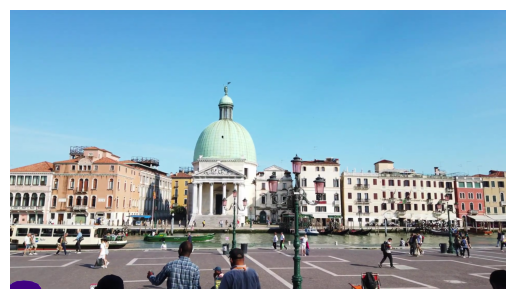

Mask Aread: 3347
Object 47 is the same as mask 23 with Jaccard index 0.9945030808448792
Opposite Jaccard index 0.9945030808448792


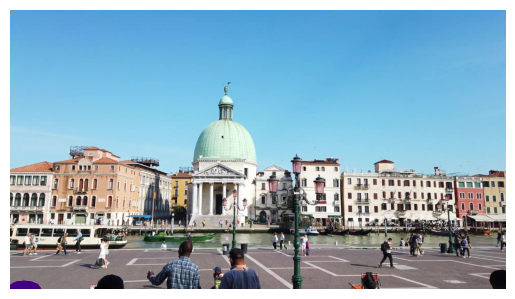

Mask Aread: 600
Object 60 is the same as mask 61 with Jaccard index 0.905961275100708
Opposite Jaccard index 0.905961275100708


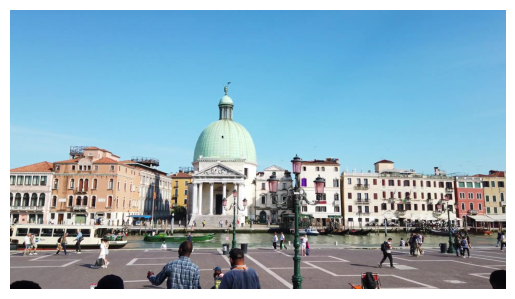

In [24]:
seg_src_to_dest = video_segments[3]
area_thresh = 1000

matches = []

j_index = JaccardIndex(task="multiclass", num_classes=2)
for mask_id, mask in enumerate(masks_frame2):\
    # print(mask["area"])
    # if mask["area"] < area_thresh: 
    #     break
    dest_segm = torch.from_numpy(mask['segmentation'])
    for obj_id, src_mask in seg_src_to_dest.items():
        src_mask = torch.from_numpy(src_mask).squeeze()
        j_index_score = j_index(src_mask, dest_segm)
        if j_index_score > 0.8:
            print(f"Mask Aread: {mask['area']}")
            print(f"Object {obj_id} is the same as mask {mask_id} with Jaccard index {j_index_score}")
            print(f"Opposite Jaccard index {j_index(dest_segm, src_mask)}")
            plt.imshow(second_frame)


            img_mask_src = np.ones((src_mask.shape[0], src_mask.shape[1], 4))
            img_mask_src[:, :, 3] = 0
            m = src_mask.cpu().numpy()
            color_mask = np.array([1., 0., 0., 0.5])
            img_mask_src[m] = color_mask 
            plt.imshow(img_mask_src)

            img_mask_dest = np.ones((src_mask.shape[0], src_mask.shape[1], 4))
            img_mask_dest[:, :, 3] = 0
            m = dest_segm.cpu().numpy()
            color_mask = np.array([0., 0., 1., 0.5])
            img_mask_dest[m] = color_mask 
            plt.imshow(img_mask_dest)

            plt.axis('off')
            plt.show()
            plt.close()
            print("="*50)

            matches.append((obj_id, mask_id, j_index_score))


In [25]:
matches, len(matches)

([(2, 1, tensor(0.9580)),
  (3, 4, tensor(0.9674)),
  (5, 4, tensor(0.9089)),
  (4, 5, tensor(0.9537)),
  (3, 6, tensor(0.9280)),
  (5, 6, tensor(0.9902)),
  (9, 9, tensor(0.9718)),
  (10, 13, tensor(0.9766)),
  (24, 15, tensor(0.9416)),
  (46, 19, tensor(0.8882)),
  (11, 23, tensor(0.9931)),
  (47, 23, tensor(0.9945)),
  (60, 61, tensor(0.9060))],
 13)

In [26]:
matches = sorted(matches, key=(lambda x: (x[0], -x[2])))
matches

[(2, 1, tensor(0.9580)),
 (3, 4, tensor(0.9674)),
 (3, 6, tensor(0.9280)),
 (4, 5, tensor(0.9537)),
 (5, 6, tensor(0.9902)),
 (5, 4, tensor(0.9089)),
 (9, 9, tensor(0.9718)),
 (10, 13, tensor(0.9766)),
 (11, 23, tensor(0.9931)),
 (24, 15, tensor(0.9416)),
 (46, 19, tensor(0.8882)),
 (47, 23, tensor(0.9945)),
 (60, 61, tensor(0.9060))]

In [27]:

# Filter the list to keep only one element for each unique x[0]
filtered_matches = []
seen = set()

for match in matches:
    if match[0] not in seen:
        filtered_matches.append(match)
        seen.add(match[0])

matches


[(2, 1, tensor(0.9580)),
 (3, 4, tensor(0.9674)),
 (3, 6, tensor(0.9280)),
 (4, 5, tensor(0.9537)),
 (5, 6, tensor(0.9902)),
 (5, 4, tensor(0.9089)),
 (9, 9, tensor(0.9718)),
 (10, 13, tensor(0.9766)),
 (11, 23, tensor(0.9931)),
 (24, 15, tensor(0.9416)),
 (46, 19, tensor(0.8882)),
 (47, 23, tensor(0.9945)),
 (60, 61, tensor(0.9060))]

Object 2 is the same as mask 1 with Jaccard index 0.9579542875289917


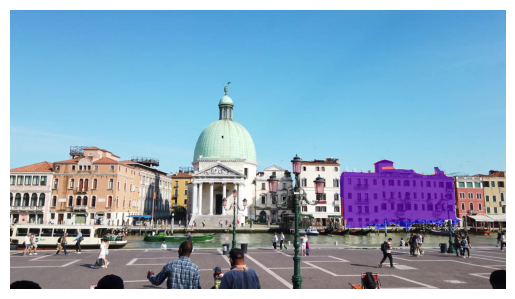

Object 3 is the same as mask 4 with Jaccard index 0.9674412608146667


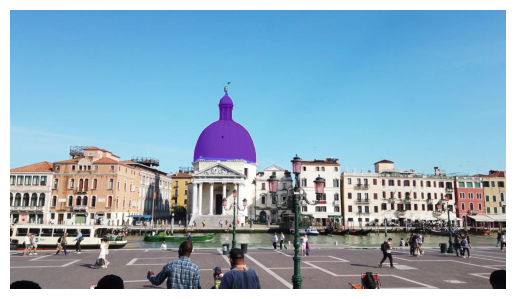

Object 4 is the same as mask 5 with Jaccard index 0.953736424446106


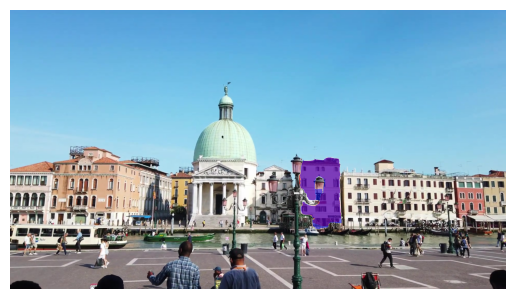

Object 5 is the same as mask 6 with Jaccard index 0.9901559948921204


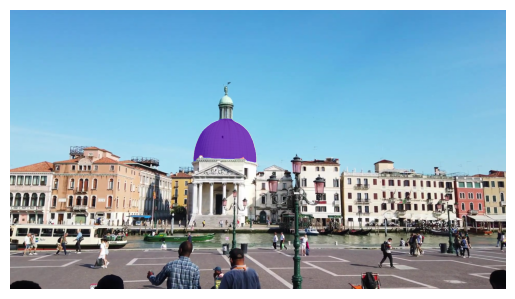

Object 9 is the same as mask 9 with Jaccard index 0.9718441367149353


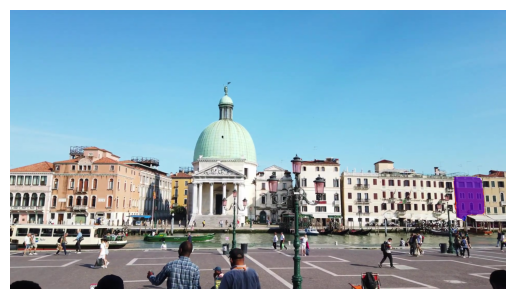

Object 10 is the same as mask 13 with Jaccard index 0.9766295552253723


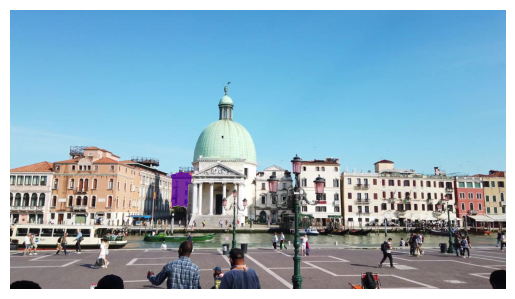

Object 11 is the same as mask 23 with Jaccard index 0.993117094039917


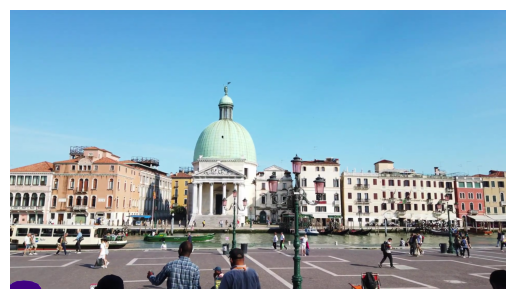

Object 24 is the same as mask 15 with Jaccard index 0.9415998458862305


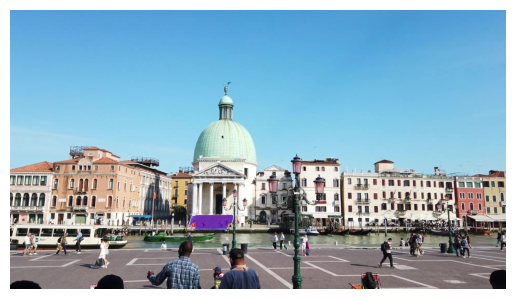

Object 46 is the same as mask 19 with Jaccard index 0.8882304430007935


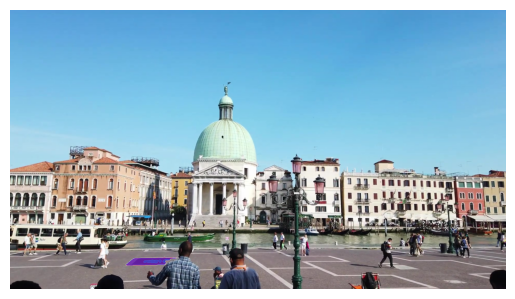

Object 47 is the same as mask 23 with Jaccard index 0.9945030808448792


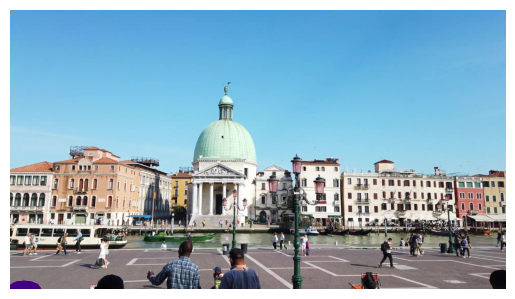

Object 60 is the same as mask 61 with Jaccard index 0.905961275100708


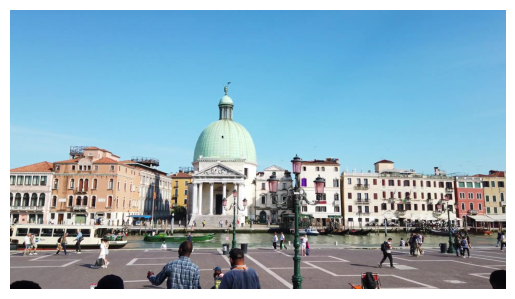

In [28]:
for obj_id, mask_id, j_score in filtered_matches:
    print(f"Object {obj_id} is the same as mask {mask_id} with Jaccard index {j_score}")
    plt.imshow(second_frame)

    m = video_segments[3][obj_id].squeeze()
    img_mask_src = np.ones((m.shape[0], m.shape[1], 4))
    img_mask_src[:, :, 3] = 0
    color_mask = np.array([1., 0., 0., 0.5])
    img_mask_src[m] = color_mask 
    plt.imshow(img_mask_src)

    m = masks_frame2[mask_id]["segmentation"].squeeze()
    img_mask_dest = np.ones((m.shape[0], m.shape[1], 4))
    img_mask_dest[:, :, 3] = 0
    color_mask = np.array([0., 0., 1., 0.5])
    img_mask_dest[m] = color_mask 
    plt.imshow(img_mask_dest)

    plt.axis('off')
    plt.show()
    plt.close()
    print("="*50)

# Step 5: Create the prompts as S_00, (S_02 U S_22)
Reset the video predictor and add S_00 (Segmentation for frame 0 based on frame 0), the union of S_02 and S_22 (aka keep the same obj_id for S_00 and S_02)


In [29]:
src_obj_id = [x[0] for x in filtered_matches]
dest_obj_id = [x[1] for x in filtered_matches]

last_obj = len(prompts)
ann_frame_idx = 3

predictor.reset_state(inference_state)

for mask_id, mask in enumerate(masks_frame2):
    if mask_id not in dest_obj_id:
        print(f"Adding mask {mask_id} as object {last_obj}")
        prompts[(last_obj, ann_frame_idx)] = torch.from_numpy(mask["segmentation"])
        last_obj += 1
    else:
        print(f"Adding mask {mask_id} as object {src_obj_id[dest_obj_id.index(mask_id)]}")
        prompts[(src_obj_id[dest_obj_id.index(mask_id)], ann_frame_idx)] = torch.from_numpy(mask["segmentation"])

for (ann_obj_id, ann_frame_idx), segmentation in prompts.items():
    print(ann_obj_id, ann_frame_idx)
    print(type(segmentation))
    print(segmentation.shape)
    f_idx, out_obj_ids, out_mask_logits = predictor.add_new_mask(
            inference_state=inference_state,
            frame_idx=ann_frame_idx,
            obj_id=ann_obj_id,
            mask=segmentation,
        )


Adding mask 0 as object 67
Adding mask 1 as object 2
Adding mask 2 as object 68
Adding mask 3 as object 69
Adding mask 4 as object 3
Adding mask 5 as object 4
Adding mask 6 as object 5
Adding mask 7 as object 70
Adding mask 8 as object 71
Adding mask 9 as object 9
Adding mask 10 as object 72
Adding mask 11 as object 73
Adding mask 12 as object 74
Adding mask 13 as object 10
Adding mask 14 as object 75
Adding mask 15 as object 24
Adding mask 16 as object 76
Adding mask 17 as object 77
Adding mask 18 as object 78
Adding mask 19 as object 46
Adding mask 20 as object 79
Adding mask 21 as object 80
Adding mask 22 as object 81
Adding mask 23 as object 11
Adding mask 24 as object 82
Adding mask 25 as object 83
Adding mask 26 as object 84
Adding mask 27 as object 85
Adding mask 28 as object 86
Adding mask 29 as object 87
Adding mask 30 as object 88
Adding mask 31 as object 89
Adding mask 32 as object 90
Adding mask 33 as object 91
Adding mask 34 as object 92
Adding mask 35 as object 93
Adding 

In [30]:
max_frame_num_to_track = 4
video_segments = {}  # video_segments contains the per-frame segmentation results
for out_frame_idx, out_obj_ids, out_mask_logits in \
    predictor.propagate_in_video(inference_state, max_frame_num_to_track=max_frame_num_to_track):
    video_segments[out_frame_idx] = {
        out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
        for i, out_obj_id in enumerate(out_obj_ids)
    }

propagate in video: 100%|██████████| 5/5 [00:03<00:00,  1.57it/s]


dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135])


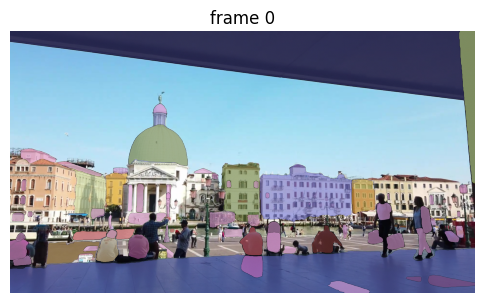

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135])


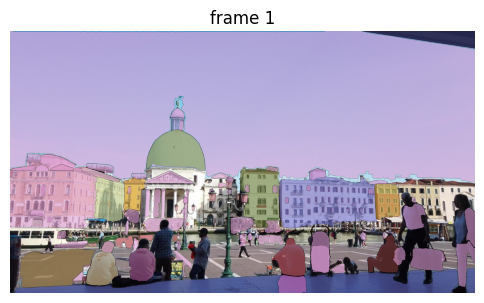

dict_keys([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135])


KeyboardInterrupt: 

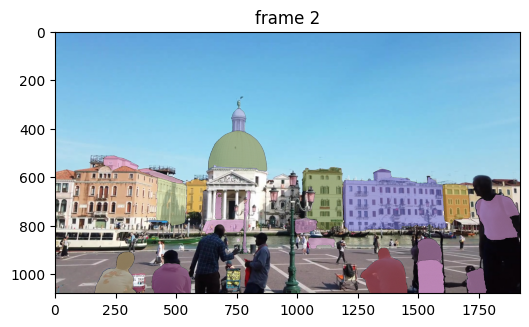

In [31]:
# render the segmentation results every few frames
vis_frame_stride = 1
plt.close("all")
# for out_frame_idx in range(0, len(frame_names), vis_frame_stride):
for out_frame_idx in range(0, max_frame_num_to_track + 1, vis_frame_stride):
    plt.figure(figsize=(6, 4))
    plt.title(f"frame {out_frame_idx}")
    plt.imshow(Image.open(os.path.join(DATA_PATH, frame_names[out_frame_idx])))
    print(video_segments[out_frame_idx].keys())
    for out_obj_id, out_mask in video_segments[out_frame_idx].items():
        # print(out_obj_id)
        # print(out_mask)
        show_mask(out_mask, plt.gca(), obj_id=out_obj_id)
        # if out_obj_id > 19: break 
    plt.savefig(f'./results/seg_sam2_{out_frame_idx}.png')
    plt.axis("off")
    plt.show()